<a href="https://colab.research.google.com/github/mendyhsu/Capstone2/blob/main/EDA_Fashion_Products.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Data Wrangling & EDA for Fashion Product Dataset**

1. Check the **Categorical Features** in raw data `style.csv`.
  * How many product categories are there?
  * Is the number of smaples (i.e., images) in each category similar or very different (imbalanced)?

2. Refine the Product Categories for Image Classification
  * Processing a new Categorical Feature `Class`
  * How to relabel the mislabled samples (`Free Items`)? 
  * Check the refined Categorical Feature `Class`.
  
3. Viewing the Product Images for each New Assigned Category
  * How do the images look like?





## Load packages

In [19]:
!pip install --upgrade plotly
!pip install -U kaleido

In [20]:
# Additional imports
import glob
import re

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder

#pd.set_option("max_columns", 30)

import plotly
import plotly.express as px
import plotly.graph_objects as go

In [21]:
print(plotly.__version__)

5.3.1


## Load files

In [22]:
# Access files from your Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [23]:
!ls 'gdrive/MyDrive/Tensorflow 2.0 Deep Learning and AI/archive (1).zip'

'gdrive/MyDrive/Tensorflow 2.0 Deep Learning and AI/archive (1).zip'


**(1) Unzip the `archive (1).zip`**


In [24]:
## Unzip the data `archive (1).zip`
from zipfile import ZipFile

with ZipFile('gdrive/MyDrive/Tensorflow 2.0 Deep Learning and AI/archive (1).zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall()

In [25]:
!ls 

EDA_FashionCate_Refine.html  eda.html	    sample_data
EDA_FashionCate_Refine.pdf   gdrive	    styles_cleaned.csv
EDA_fig_FashionCate.html     images	    styles.csv
EDA_fig_FashionCate.pdf      myntradataset


In [26]:
## List of image file paths
img_files = glob.glob('myntradataset/images/*.jpg')

#img_id = [int(re.findall(r'\d+', img)[0]) for img in img_files]
img_id = [(re.findall(r'\d+', img)[0]) for img in img_files]

print('Total number of images:', len(set(img_id)))


Total number of images: 44441


(80, 60, 3)


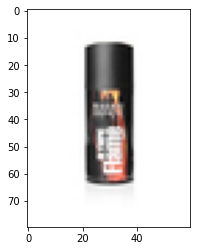

In [27]:
## View some of the images
image_path = 'myntradataset/images/54967.jpg'#img_files[20]
# print(image_path)
image = plt.imread(image_path)
inputShape = image.shape
print(inputShape)

_ = plt.imshow(image/255)
plt.show()

**(2) Load the spreadsheet `styles.csv` for the image descriptions**

In [28]:
## Check styles.csv
!head 'myntradataset/styles.csv'

id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011,Casual,Turtle Check Men Navy Blue Shirt
39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012,Casual,Peter England Men Party Blue Jeans
59263,Women,Accessories,Watches,Watches,Silver,Winter,2016,Casual,Titan Women Silver Watch
21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011,Casual,Manchester United Men Solid Black Track Pants
53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012,Casual,Puma Men Grey T-shirt
1855,Men,Apparel,Topwear,Tshirts,Grey,Summer,2011,Casual,Inkfruit Mens Chain Reaction T-shirt
30805,Men,Apparel,Topwear,Shirts,Green,Summer,2012,Ethnic,Fabindia Men Striped Green Shirt
26960,Women,Apparel,Topwear,Shirts,Purple,Summer,2012,Casual,Jealous 21 Women Purple Shirt
29114,Men,Accessories,Socks,Socks,Navy Blue,Summer,2012,Casual,Puma Men Pack of 3 Socks


In [29]:
## Load styles sheets
styles = pd.read_csv('myntradataset/styles.csv', header=None, names=range(11))
styles.drop(columns=10, inplace=True)
styles.columns = styles.iloc[0]
styles = styles.iloc[1:].reset_index(drop=True)
#styles.id = pd.to_numeric(styles['id'])
#styles.year = pd.to_numeric(styles['year'])
styles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44446 entries, 0 to 44445
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   id                  44446 non-null  object
 1   gender              44446 non-null  object
 2   masterCategory      44446 non-null  object
 3   subCategory         44446 non-null  object
 4   articleType         44446 non-null  object
 5   baseColour          44431 non-null  object
 6   season              44425 non-null  object
 7   year                44445 non-null  object
 8   usage               44129 non-null  object
 9   productDisplayName  44439 non-null  object
dtypes: object(10)
memory usage: 3.4+ MB


In [30]:
print('Total number of id (styles):', len(set(styles.id)))
print('Total number of images:', len(set(img_id)))

## Keep the overlaped images==id
no_img = set(styles.id).difference(img_id)
styles = styles[~styles.id.isin(no_img)]
styles.shape

Total number of id (styles): 44446
Total number of images: 44441


(44441, 10)

In [31]:
styles.head(10)

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012,Casual,Peter England Men Party Blue Jeans
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016,Casual,Titan Women Silver Watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011,Casual,Manchester United Men Solid Black Track Pants
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012,Casual,Puma Men Grey T-shirt
5,1855,Men,Apparel,Topwear,Tshirts,Grey,Summer,2011,Casual,Inkfruit Mens Chain Reaction T-shirt
6,30805,Men,Apparel,Topwear,Shirts,Green,Summer,2012,Ethnic,Fabindia Men Striped Green Shirt
7,26960,Women,Apparel,Topwear,Shirts,Purple,Summer,2012,Casual,Jealous 21 Women Purple Shirt
8,29114,Men,Accessories,Socks,Socks,Navy Blue,Summer,2012,Casual,Puma Men Pack of 3 Socks
9,30039,Men,Accessories,Watches,Watches,Black,Winter,2016,Casual,Skagen Men Black Watch


## 1. Check the Product Categories (given in the original data)

### **How many product categories are there?**

Apparel           21395
Accessories       11289
Footwear           9222
Personal Care      2404
Free Items          105
Sporting Goods       25
Home                  1
Name: masterCategory, dtype: int64

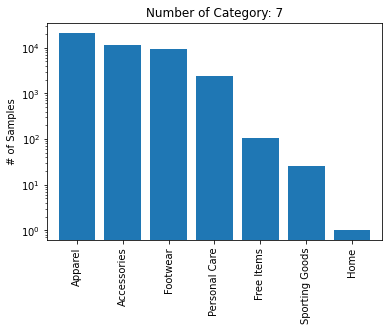

In [32]:
## See Categorical counts at level of masterCategory
display(styles.masterCategory.value_counts())
fig, ax = plt.subplots()
styles.masterCategory.value_counts().plot.bar(ax=ax, align='center', width=0.8)
ax.set_yscale("log")
plt.ylabel('# of Samples')
plt.title('Number of Category: {}'.format(len(set(styles.masterCategory))))
plt.show()

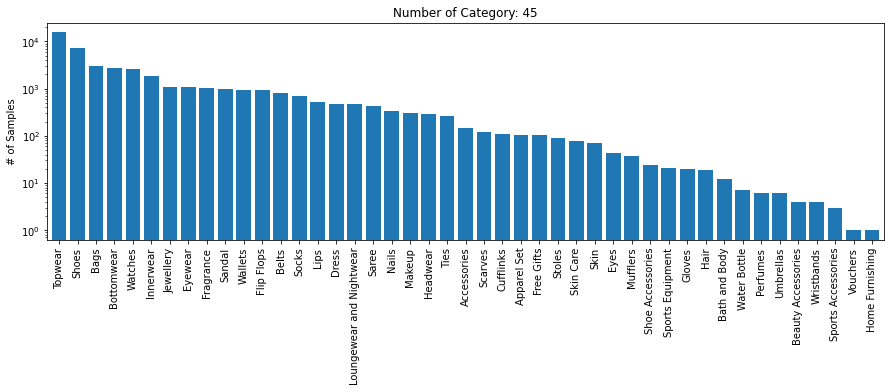

In [33]:
## See Categorical counts at level of subCategory
fig, ax = plt.subplots(figsize=(15, 4))
styles.subCategory.value_counts().plot.bar(ax=ax, align='center', width=0.8)
ax.set_yscale("log")
plt.ylabel('# of Samples')
plt.title('Number of Category: {}'.format(len(set(styles.subCategory))))
plt.show()

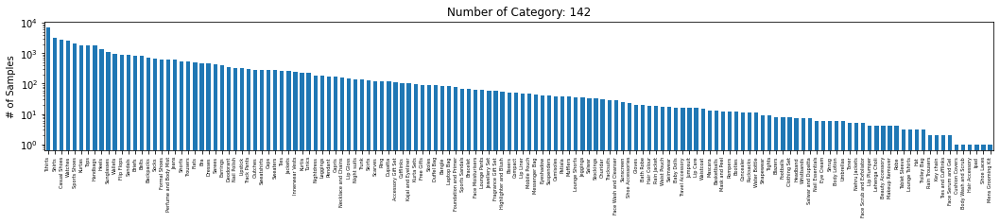

In [34]:
fig, ax = plt.subplots(figsize=(18, 2.5))
styles.articleType.value_counts().plot.bar(ax=ax, width=0.6)
ax.set_yscale("log")
plt.ylabel('# of Samples')
plt.title('Number of Category: {}'.format(len(set(styles.articleType))))
ax.set_xticklabels(ax.get_xticklabels(), fontsize=5) 
plt.show()

**Take-away**
  * The number of categories at the three levels are 7, 45 and 142.
  * The sample counts are highly imbalanced.
  * What's the relation between differnt categorical levels? (Sunburst plot in next section).


### **Is the number of smaples/images in each category similar or very different (imbalanced)?**
We will use a `sunburst plot` to visualize the proportion of items/images in different categorical levels, `masterCategory`, `subCategory`, and `articleType`.

In [35]:
styles_count = styles.groupby(by=["masterCategory", "subCategory", "articleType"]).count()[["id"]].rename(columns={"id":"Count"})
styles_count = styles_count.reset_index()
styles_count['Fashion Products'] = 'Fashion Products'
styles_count.head()

,masterCategory,subCategory,articleType,Count,Fashion Products
0,Accessories,Accessories,Accessory Gift Set,111,Fashion Products
1,Accessories,Accessories,Hair Accessory,1,Fashion Products
2,Accessories,Accessories,Key chain,2,Fashion Products
3,Accessories,Accessories,Messenger Bag,10,Fashion Products
4,Accessories,Accessories,Travel Accessory,15,Fashion Products


In [36]:
fig = px.sunburst(styles_count,
                  path=['Fashion Products', "masterCategory", "subCategory", "articleType"],
                  values='Count',
                  title="Fashion Product Category", width=750, height=750)
fig.write_html("EDA_fig_FashionCate.html")
fig.write_image("EDA_fig_FashionCate.pdf", engine="kaleido")
fig.show()


**Take-away:** 
  * The number of samples for each Category is highly imbalanced.
  * Four dominated `masterCategory` are 1) *Apparel*, 2) *Accessories*, 3)*Footwear* and 4) *Personal Care*.
  * Around 50% of samples are Apparel, in which *Topwear* is the dominated `subCategory`.

## 2. Refine the Product Categories for Image Classification

### **Processing a new Categorical Feature: `Class`**
Defined a new categorical feature `Class` that combines the three hierarchical labels (`masterCategory`,`subCategory`, `articleType`), with the number of categories no larger than 35.

1. Initialize `Class` with the `masterCategory`.
2. Group by `subCategory`. If the sample count is greater than 105, we keep that `subCategory` in the `Class`. 
3. Group by `articleType`. We keep the `articleType` **Tshirts** and **Shirts** in `Class` as they are two dominated products in **Topwear**.

4. Check the sample count in each `Class`. If sample count is less than 5, we drop it from `Class`.

In [37]:
## Set a new Categorical features `Class`

# 1) Initialize `Class` with `masterCategory`
styles['Class'] = styles['masterCategory'] 

# Check the categorical label counts (for the first 2 levels)
cat_sort = styles[['masterCategory','subCategory']
                  ].value_counts().to_frame().reset_index().rename(columns={0:"Count"})
display(cat_sort.head(30))

,masterCategory,subCategory,Count
0,Apparel,Topwear,15401
1,Footwear,Shoes,7344
2,Accessories,Bags,3055
3,Apparel,Bottomwear,2693
4,Accessories,Watches,2542
5,Apparel,Innerwear,1808
6,Accessories,Jewellery,1080
7,Accessories,Eyewear,1073
8,Personal Care,Fragrance,1012
9,Footwear,Sandal,963


In [38]:
# 2) if [`masterCategory`, `subCategory`] has count >= 105, keep its category label
cat_repalce = cat_sort[cat_sort['Count'] >= 105]['subCategory'].to_list()
row_sel = styles['subCategory'].isin(cat_repalce)
styles.loc[row_sel, 'Class'] = styles.loc[row_sel, 'subCategory']


In [39]:
# Check the new joint [`Class`, `articleType`] categorical count
cat_sort = styles[['Class', 'articleType']
                  ].value_counts().to_frame().reset_index().rename(columns={0:"Count"})
display(cat_sort.head(30))


,Class,articleType,Count
0,Topwear,Tshirts,7068
1,Topwear,Shirts,3215
2,Shoes,Casual Shoes,2846
3,Watches,Watches,2542
4,Shoes,Sports Shoes,2036
5,Topwear,Kurtas,1844
6,Topwear,Tops,1762
7,Bags,Handbags,1757
8,Shoes,Heels,1323
9,Eyewear,Sunglasses,1073


In [40]:
# 3) if `articleType` has count > 3000, we keep the label in `Class`
cat_repalce = cat_sort[cat_sort['Count'] > 3000]['articleType'].to_list()
row_sel = styles['articleType'].isin(cat_repalce)
styles.loc[row_sel, 'Class'] = styles.loc[row_sel, 'articleType']

print(len(set(styles['Class'])))
set(styles['Class'])

32


{'Accessories',
 'Apparel Set',
 'Bags',
 'Belts',
 'Bottomwear',
 'Cufflinks',
 'Dress',
 'Eyewear',
 'Flip Flops',
 'Fragrance',
 'Free Items',
 'Headwear',
 'Home',
 'Innerwear',
 'Jewellery',
 'Lips',
 'Loungewear and Nightwear',
 'Makeup',
 'Nails',
 'Personal Care',
 'Sandal',
 'Saree',
 'Scarves',
 'Shirts',
 'Shoes',
 'Socks',
 'Sporting Goods',
 'Ties',
 'Topwear',
 'Tshirts',
 'Wallets',
 'Watches'}

In [41]:
# 4) If number of items of a Class < 5, then drop it
cat_sort = styles[['Class']].value_counts().to_frame().reset_index().rename(columns={0:"Count"})
display(cat_sort)

cat_keep = cat_sort[cat_sort['Count'] > 5]['Class'].to_list()
row_sel = styles['Class'].isin(cat_keep)
styles = styles.loc[row_sel, :]

print(len(set(styles['Class'])))
set(styles['Class'])

,Class,Count
0,Shoes,7344
1,Tshirts,7069
2,Topwear,5118
3,Shirts,3215
4,Bags,3055
5,Bottomwear,2693
6,Watches,2542
7,Innerwear,1808
8,Jewellery,1080
9,Eyewear,1073


31


{'Accessories',
 'Apparel Set',
 'Bags',
 'Belts',
 'Bottomwear',
 'Cufflinks',
 'Dress',
 'Eyewear',
 'Flip Flops',
 'Fragrance',
 'Free Items',
 'Headwear',
 'Innerwear',
 'Jewellery',
 'Lips',
 'Loungewear and Nightwear',
 'Makeup',
 'Nails',
 'Personal Care',
 'Sandal',
 'Saree',
 'Scarves',
 'Shirts',
 'Shoes',
 'Socks',
 'Sporting Goods',
 'Ties',
 'Topwear',
 'Tshirts',
 'Wallets',
 'Watches'}

In [42]:
cat_sort = styles[['Class']].value_counts().to_frame().reset_index().rename(columns={0:"Count"})
cat_sort

,Class,Count
0,Shoes,7344
1,Tshirts,7069
2,Topwear,5118
3,Shirts,3215
4,Bags,3055
5,Bottomwear,2693
6,Watches,2542
7,Innerwear,1808
8,Jewellery,1080
9,Eyewear,1073


Check the items in the class `Free Items`:

In [43]:
styles[styles['Class'].str.contains('Free')].head(10)

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,Class
352,53598,Men,Free Items,Free Gifts,Free Gifts,Black,Winter,2016,Sports,Q&Q Men Black Digital Watch,Free Items
826,49696,Men,Free Items,Free Gifts,Ties,Blue,Summer,2012,Formal,Park Avenue Blue Patterned Tie,Free Items
874,53591,Men,Free Items,Free Gifts,Free Gifts,White,Winter,2016,Casual,Q&Q Men White Dial Watch,Free Items
1137,45894,Men,Free Items,Free Gifts,Free Gifts,Black,Winter,2016,Casual,Maxima Men Black Dial Watch,Free Items
1360,53596,Men,Free Items,Free Gifts,Free Gifts,Navy Blue,Winter,2016,Casual,Q&Q Men Navy Blue Digital Watch,Free Items
1376,52676,Women,Free Items,Free Gifts,Free Gifts,White,Winter,2016,Casual,Morellato Women White Dial Watch,Free Items
1394,29975,Women,Free Items,Free Gifts,Free Gifts,Black,Winter,2016,Casual,Aspen Women Black Dial Watch,Free Items
1551,29981,Women,Free Items,Free Gifts,Free Gifts,Blue,Winter,2016,Casual,Aspen Women Blue Dial Watch,Free Items
2543,51091,Women,Free Items,Free Gifts,Free Gifts,Green,Summer,2012,Ethnic,Satya Paul Green Saree,Free Items
2663,54970,Women,Free Items,Free Gifts,Free Gifts,Pink,Spring,2017,Casual,Rasasi Women Body Lotion,Free Items


**Take-away**
 * The new feature `Class` has 31 product categories.
 * However, all samples labeled as `Free Items` are misclassified.

### **How to relabel the *Free Items*?**  

We will predict their product labels based on `productDisplayName`.

1. Compute the **Text Similarity** between `productDisplayName` and the 30 product categories (listed in `cat_sort`).
2. Replace their current `Class` (*Free Items*) with the predicted/matched category.
3. For items without matched category, labeled them as `Unknow`.


In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

import nltk
nltk.download('punkt')

from nltk.stem import PorterStemmer
from nltk.stem import LancasterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize

porter = PorterStemmer()
lancaster = LancasterStemmer()

def sent_porter(input_sent):
  '''
  sent_porter - Normalized the words (plurl none, verb) in a sentence/phrase.
  '''
  new_sent=''

  for word in word_tokenize(input_sent):
    new_sent += (porter.stem(word)+' ')

  return new_sent

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [45]:
free_item_Name = styles[styles['Class'].str.contains('Free')][['id','productDisplayName']].set_index('id')

item_Name = free_item_Name.append(cat_sort[['Class']].rename(columns={'Class':"productDisplayName"}))
item_Name['productDisplayName'] = item_Name['productDisplayName'].apply(sent_porter)


In [46]:
corpus = item_Name['productDisplayName']

vectorizer = TfidfVectorizer()
trsfm = vectorizer.fit_transform(corpus)

item_Name_tdv = pd.DataFrame(trsfm.toarray(), columns=vectorizer.get_feature_names(), 
                             index=item_Name.index)

In [47]:
item_Name_tdv.head()

,100ww,116,7dr,accessori,american,and,apparel,arrow,aspen,avenu,backpack,bag,baggit,belkin,belt,black,blue,bodi,bottomwear,broad,bronz,brown,care,cascad,casio,charcoal,check,clutch,cole,corso,cream,cricket,cufflink,deo,dial,digit,dress,dynam,ed,elektra,...,revers,royal,sandal,sare,satchel,satya,scarf,scarv,scuba,senorita,set,shirt,shock,shoe,silver,simpl,skill,sling,sock,sport,steel,stoln,sunglass,taylor,team,tie,timex,titan,ton,topwear,tourist,tshirt,unisex,van,vital,wallet,watch,white,women,yellow
53598,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.475912,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.694055,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.381966,0.000000,0.0,0.0
49696,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.440991,0.0,0.0,0.0,0.0,0.0,0.000000,0.372835,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.428511,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
53591,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.499763,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.438228,0.605102,0.0,0.0
45894,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.463923,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.424626,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.372343,0.000000,0.0,0.0
53596,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.408100,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.482703,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.265650,0.000000,0.0,0.0


In [124]:
# Computet the cosine similarity
cos_sim = cosine_similarity(item_Name_tdv)

#_ = sns.heatmap(cos_sim)

In [49]:
# The predicted Class index
pred_Class_ind = np.argmax(cos_sim[:,-31:], axis=1)
item_Name['Class'] = cat_sort.loc[pred_Class_ind, 'Class'].values

# If all the item's cos_sim vector are all 0, it should be labeled as `Unknow`
item_Name.loc[cos_sim[:,-31:].sum(axis=1)==0,'Class'] = 'Unknow' #if all the 

item_Name[item_Name.Class=='Unknow']

,productDisplayName,Class
54970,rasasi women bodi lotion,Unknow
15349,nike men blue team india cricket jersey,Unknow
50234,stoln women white sunglass,Unknow
43285,murcia women black backpack,Unknow
15658,belkin unisex simpl messeng blue handbag,Unknow
28367,ide men steel sunglass,Unknow
57600,lotu herbal moistpet royal plum lipstick 116,Unknow
57264,murcia women black handbag,Unknow
57457,pitaraa women mustard clutch,Unknow
16943,imag women black sunglass,Unknow


In [50]:
free_item_Name = free_item_Name.join(item_Name[['Class']], how='left')
free_item_Name

,productDisplayName,Class
id,,
53598,Q&Q Men Black Digital Watch,Watches
49696,Park Avenue Blue Patterned Tie,Ties
53591,Q&Q Men White Dial Watch,Watches
45894,Maxima Men Black Dial Watch,Watches
53596,Q&Q Men Navy Blue Digital Watch,Watches
...,...,...
54969,Rasasi Men Dynamic Energy Deo,Unknow
54967,Rasasi Men Olympic Flame Deo,Unknow
36346,Reid & Taylor Men Maroon Checked Tie,Ties


In [51]:
styles = styles.set_index('id')
styles.loc[free_item_Name.index,'Class'] = free_item_Name['Class']
styles = styles.reset_index()

In [52]:
# Check if the all `Free items` have been reassigned.
styles[styles.Class.str.contains('Free')]

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,Class


### **Check the refined Categorical Feature `Class`.**

In [53]:
styles_count = styles.groupby(by=['Class',"subCategory", 
                                  "articleType"]).count()[["id"]].rename(columns={"id":"Count"})
styles_count = styles_count.reset_index()
styles_count['Fashion Products'] = 'Fashion Products'
styles_count.head()

,Class,subCategory,articleType,Count,Fashion Products
0,Accessories,Accessories,Accessory Gift Set,111,Fashion Products
1,Accessories,Accessories,Hair Accessory,1,Fashion Products
2,Accessories,Accessories,Key chain,2,Fashion Products
3,Accessories,Accessories,Messenger Bag,10,Fashion Products
4,Accessories,Accessories,Travel Accessory,15,Fashion Products


In [54]:
fig = px.sunburst(styles_count,
                  path=['Fashion Products', "Class", "articleType"],
                  values='Count',
                  title="Fashion Product Category (reassigned)", width=750, height=750)

fig.write_html("EDA_FashionCate_Refine.html")
fig.write_image("EDA_FashionCate_Refine.pdf", engine="kaleido")
fig.show()


In [55]:
## Save the processed DataFrame: `style` 
styles.to_csv('styles_cleaned.csv', index=None)

Sample count in each product category.

In [56]:
# The rest of free items labled as `Unknow`. They will be used for prediction.
# styles_unkonw = styles[styles['Class'].str.contains('Unknow')].copy()
# print(styles_unkonw.shape)

# The items with well-defined Class. They will be used as train-validation.
styles_know = styles[~styles['Class'].str.contains('Unknow')].copy()
print(styles_know.shape)

(44414, 11)


In [57]:
print('Number of Classes:', len(set(styles_know['Class'])),'\n')
class_count = styles_know[['Class']].value_counts().to_frame().rename(columns={0:"Count"}).reset_index()
class_count.head()

Number of Classes: 30 



,Class,Count
0,Shoes,7344
1,Tshirts,7069
2,Topwear,5118
3,Shirts,3215
4,Bags,3059


Number of classes: 30


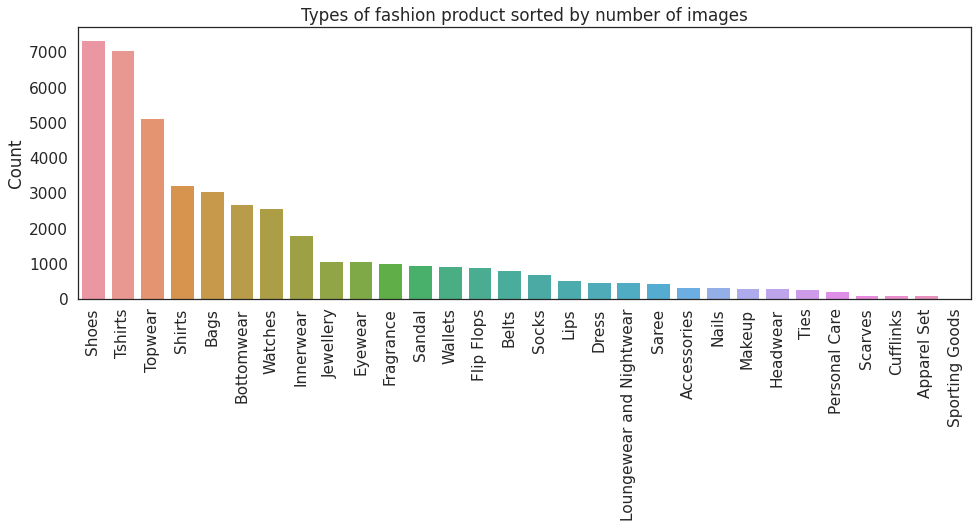

In [58]:
print('Number of classes:', class_count.shape[0])

sns.set_theme(style="white", font_scale=1.4)
plt.figure(figsize=(16,5))
sns.barplot(x='Class',y="Count", data=class_count)

plt.xticks(rotation=90)
plt.title('Types of fashion product sorted by number of images')
plt.xlabel('')
plt.show()

**Take-away** 
  * Most common classes are *Shoes*, *Tshirt*, *Topwear*.
  * In contrast the small components like the *Scarves*, *Cufflinks*,	*Apparel Set* and *Sporting Goods* are quite rare in our data. 
  * We might expect less accurate predictions on these minor classes.
  * Whetehr the accuracy is the right score to measure the performance and validation?


## 3. Viewing the Product Images for each New Assigned Category

In [67]:
import random

In [119]:
def plot_image_cate(df, cat_feat, label):
  '''
  plot_image_cate - plot 20 images given a label of a categorical feature.

  Parameters
    ----------
    df: pandas DataFrame.

    cat_feat: str
        A name of a column in `data_frame`.
        Values from this column are used as labels for sectors.
    label: str
        A selected label from column [cat_feat] in `data_frame`.
  
  Returns
    -------
        matplotlib.fiures
  '''

  temp = df[df[cat_feat]==label].reset_index(drop=True).copy()
  ind_samp = random.sample(temp.index.to_list(), 20)
  temp20 = temp.loc[ind_samp]

  fig, axes = plt.subplots(4, 5, figsize=(12.5, 12.5))
  i = 0
  for index, row in temp20.iterrows():
    image = plt.imread('myntradataset/images/%s.jpg' %(row.id))
    ax = axes.flat[i]
    ax.imshow(image/255)
    #ax.set_title(row.Class)
    ax.axis('off')
    ax.text(10, 0, row.subCategory, size='xx-small')
    ax.text(10, 5, row.articleType, size='xx-small')
    i+=1

  plt.suptitle('Class: ' + row[cat_feat], y=1.01)
  plt.tight_layout()
  plt.show()

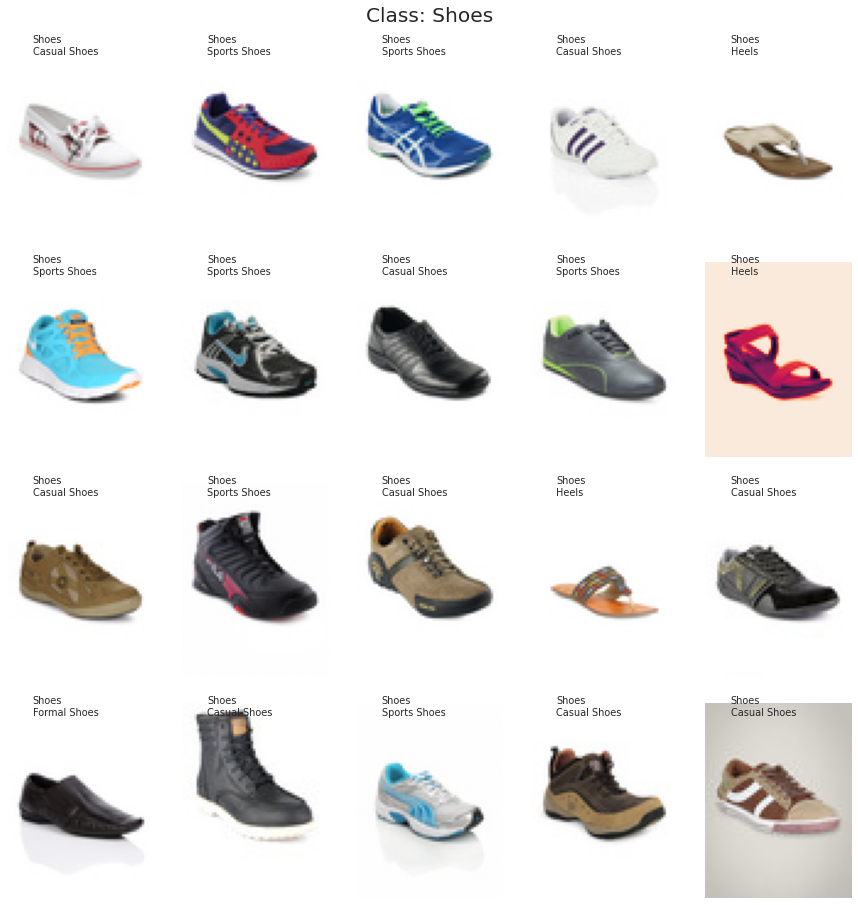

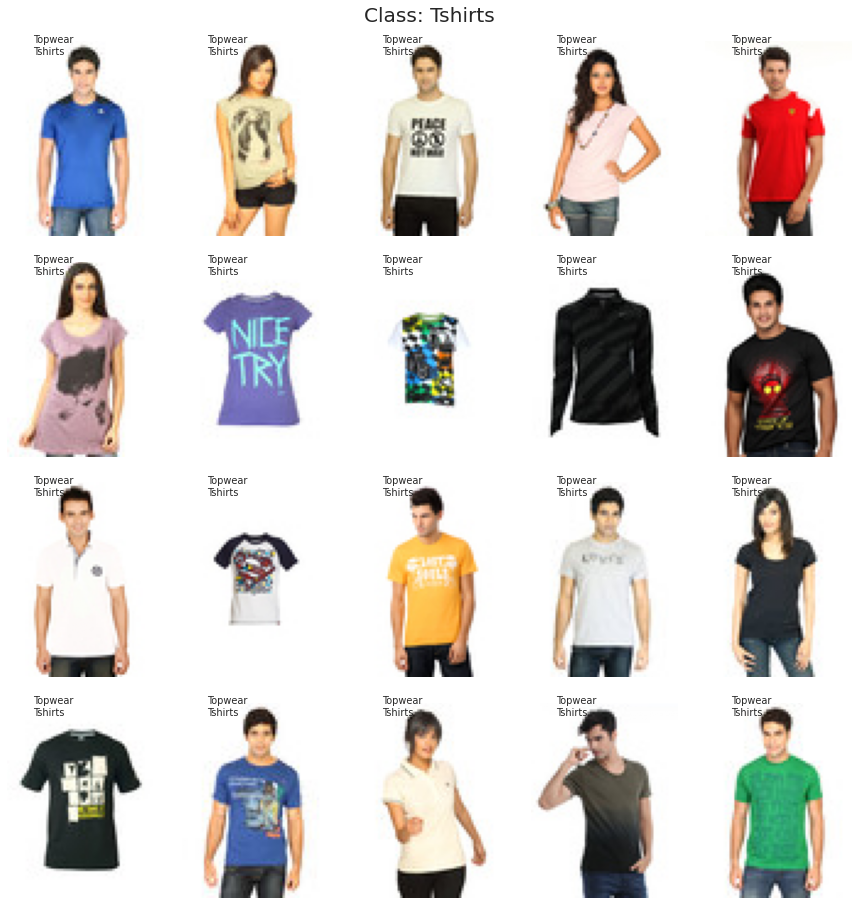

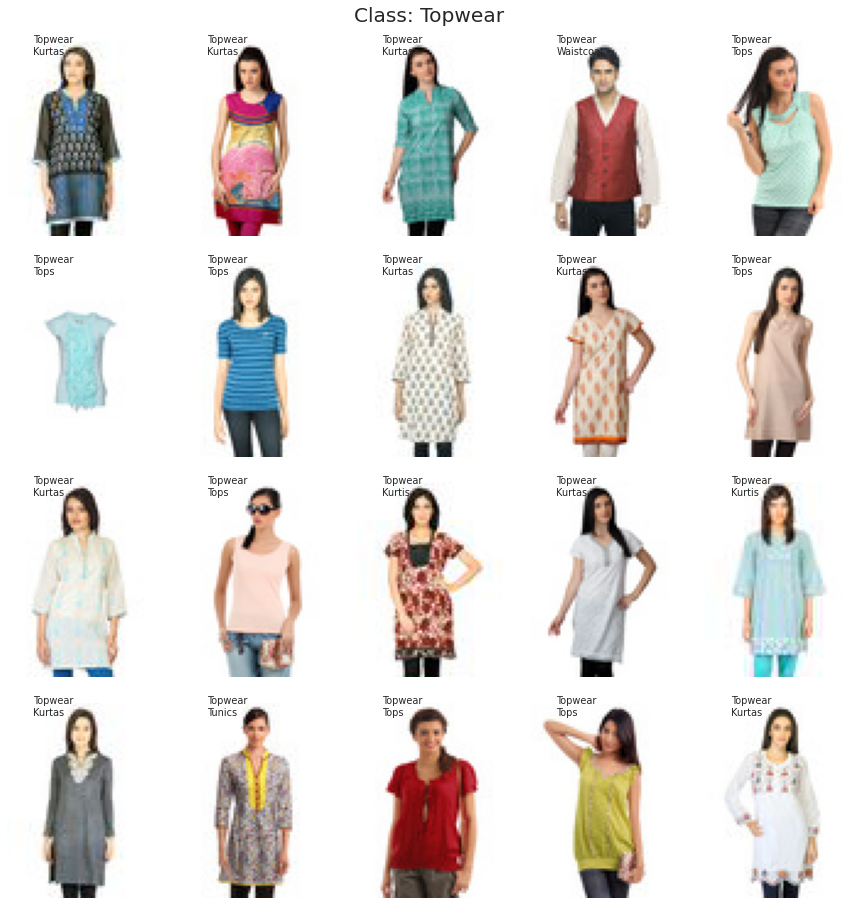

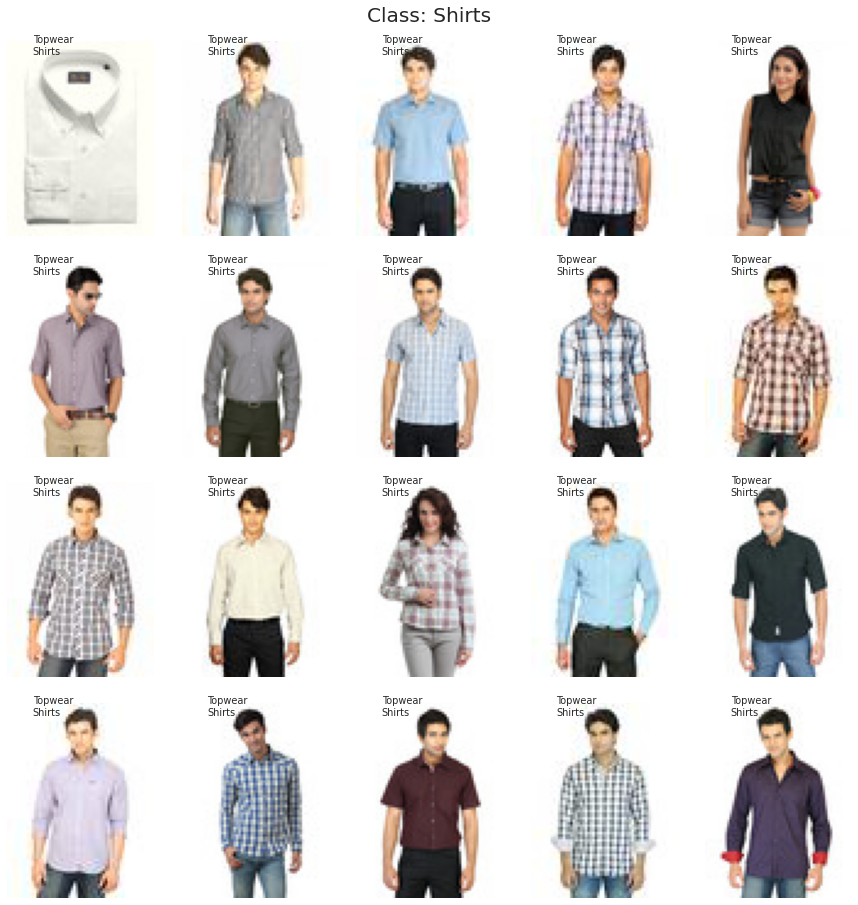

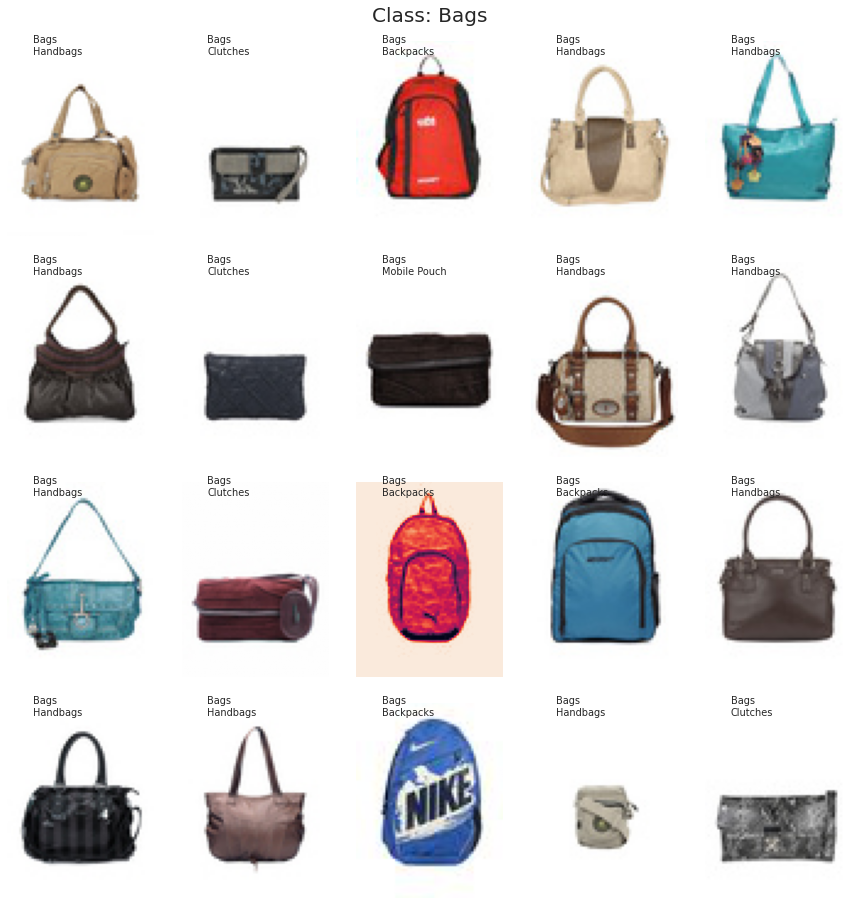

...

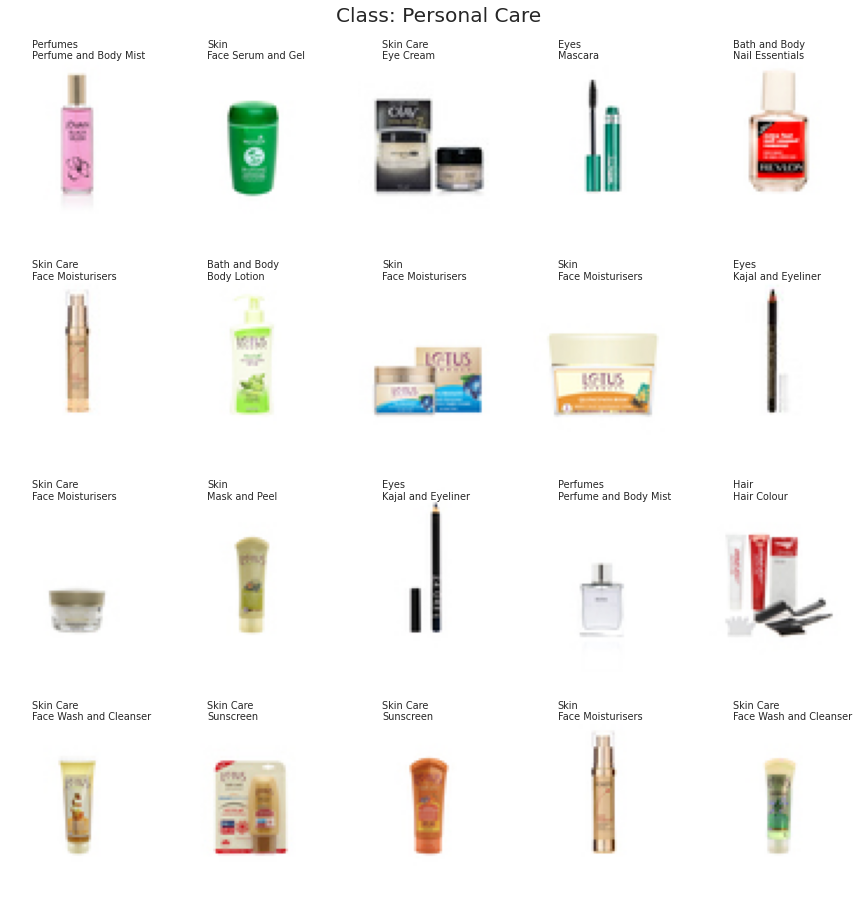

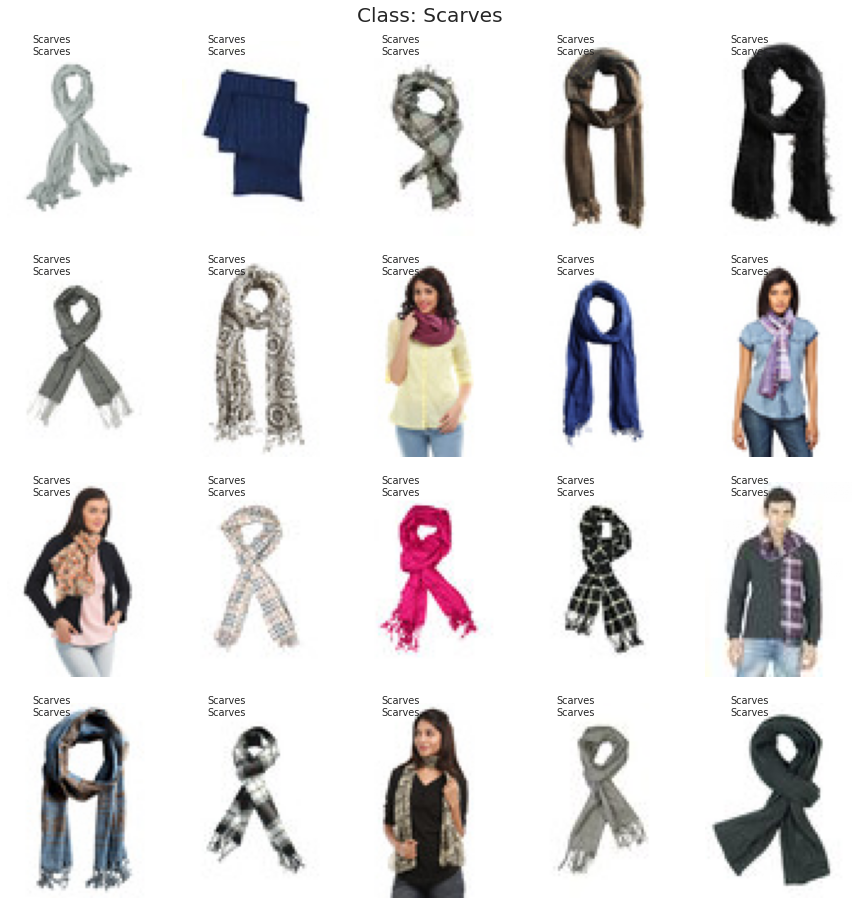

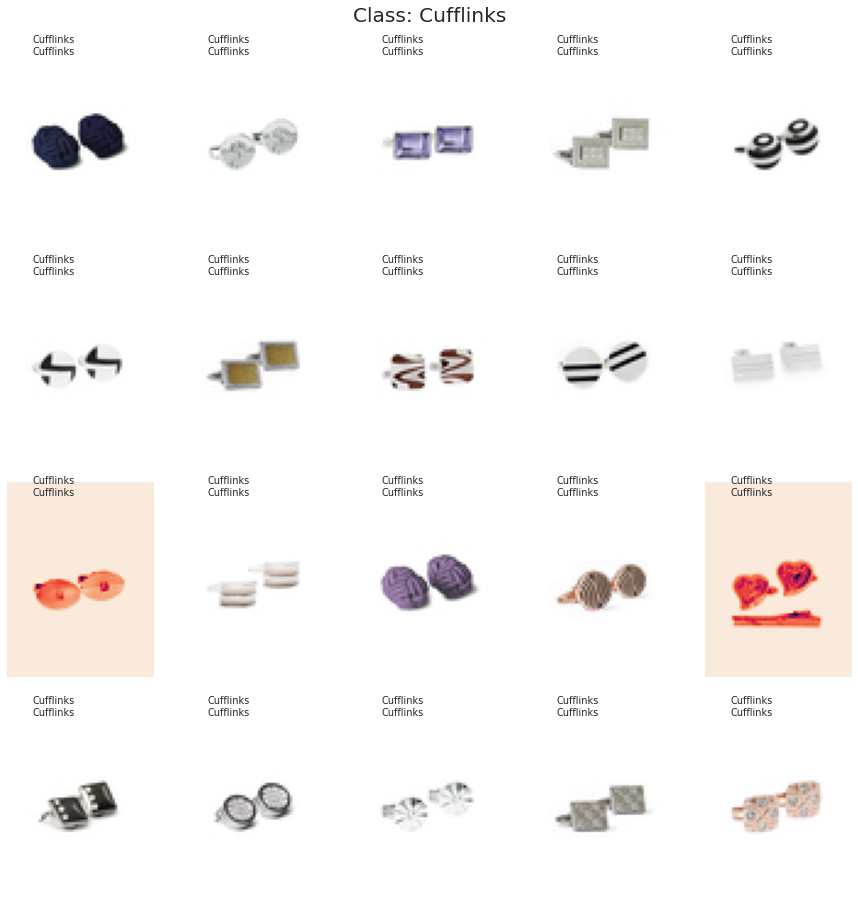

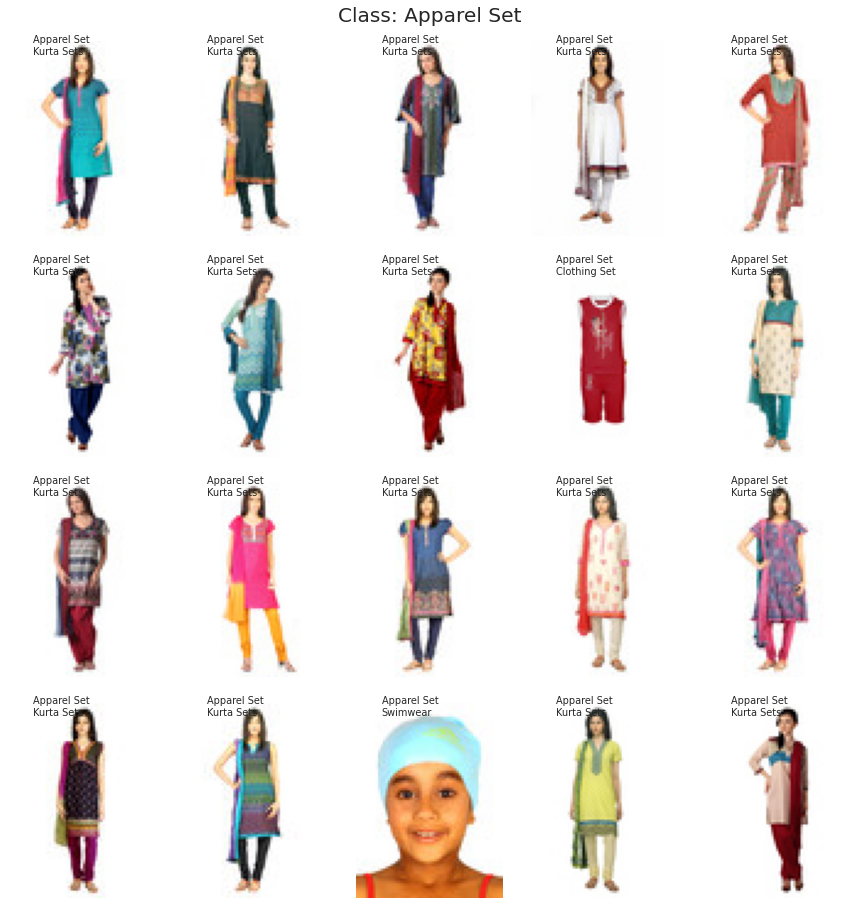

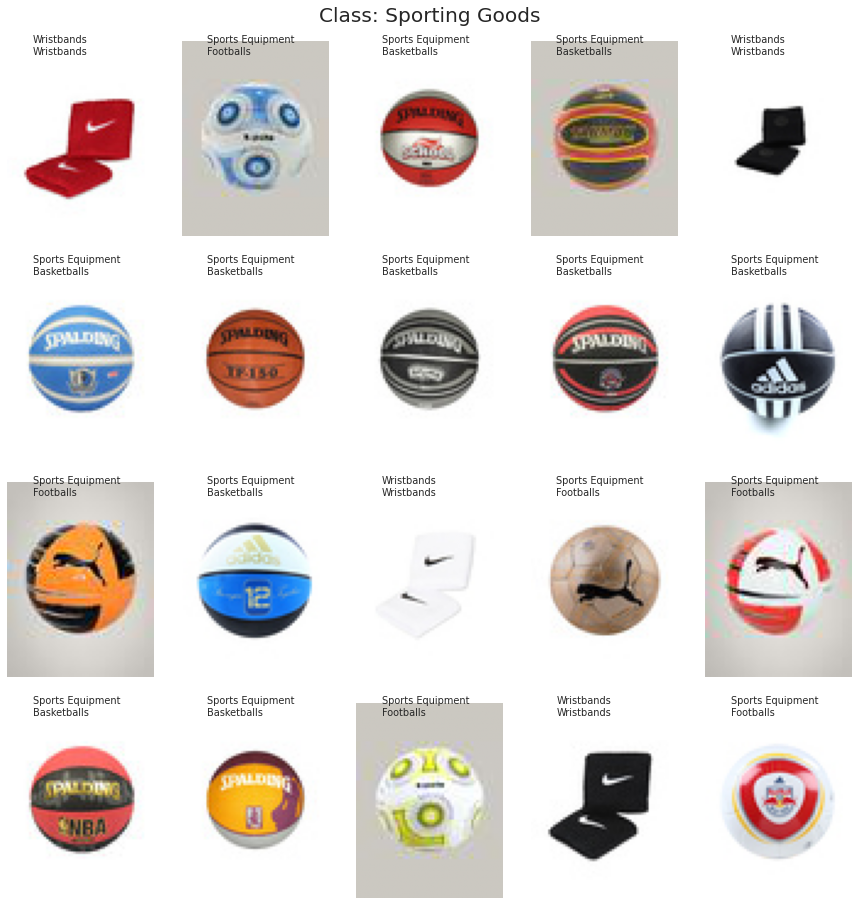

In [121]:
# labels = list(set(styles_know['Class']))
labels = class_count.Class.to_list()

for label in labels:
  plot_image_cate(styles_know,'Class', label)

**Take-away**
 * The images' background mostly are white, some with light colors.
 * The classes with ambiguous images (more product variety) are: 
   - *Accessory*
   - *Personal Care*
   - *Jewellery*
   - *Loungewear and Nightwear*